In [101]:
import pandas as pd
PATH_TO_TRAIN = '../data/raw/train15.csv'
INDEX_COLUMN = 'TIMESTAMP'
TARGET_COLUMN = 'POWER'
df_power = pd.read_csv(PATH_TO_TRAIN)
PATH_TO_PREDICTORS = '../data/raw/predictors15.csv'
df_features = pd.read_csv(PATH_TO_PREDICTORS)
df_original = df_power.merge(df_features, how='left', on=[INDEX_COLUMN,'ZONEID'])

In [102]:
#df = df_original[df_original["ZONEID"] == 1].drop('ZONEID',axis=1)
df = df_original.copy()
column_mapping = {"VAR78":"LIQUID_WATER", "VAR79": "ICE_WATER",  "VAR134":"SURFACE_PRESSURE","VAR157":"RELATIVE_HUMIDITY","VAR164":"TOTAL_CLOUD_COVER","VAR165":"WIND_U","VAR166":"WIND_V","VAR167":"TEMPERATURE","VAR169":"SOLAR_RAD","VAR175":"TERMAL_RAD","VAR178":"TOP_NET_SOLAR_RAD","VAR228":"TOTAL_PRECIPATION"}
df = df.rename(index=str, columns=column_mapping)
DATE_FORMAT = '%Y%m%d %H:%M'
dateparse = lambda x: pd.datetime.strptime(x, DATE_FORMAT)
df[INDEX_COLUMN] = df[INDEX_COLUMN].apply(dateparse)
df = df.set_index(INDEX_COLUMN)
df["YEAR"] = df.index.year
df["MONTH"] = df.index.month
df["DAY"] = df.index.day
df["HOUR"] = df.index.hour
df.head()

,ZONEID,POWER,LIQUID_WATER,ICE_WATER,SURFACE_PRESSURE,RELATIVE_HUMIDITY,TOTAL_CLOUD_COVER,WIND_U,WIND_V,TEMPERATURE,SOLAR_RAD,TERMAL_RAD,TOP_NET_SOLAR_RAD,TOTAL_PRECIPATION,YEAR,MONTH,DAY,HOUR
TIMESTAMP,,,,,,,,,,,,,,,,,,
2012-04-01 01:00:00,1,0.754103,0.001967,0.003609,94843.6250,60.221909,0.244601,1.039334,-2.503039,294.448486,2577830.0,1202532.0,2861797.0,0.000000,2012,4,1,1
2012-04-01 02:00:00,1,0.555000,0.005524,0.033575,94757.9375,54.678604,0.457138,2.482865,-2.993330,295.651367,5356093.0,2446757.0,5949378.0,0.000000,2012,4,1,2
2012-04-01 03:00:00,1,0.438397,0.030113,0.132009,94732.8125,61.294891,0.771429,3.339867,-1.982535,294.454590,7921788.0,3681336.0,8939176.0,0.001341,2012,4,1,3
2012-04-01 04:00:00,1,0.145449,0.057167,0.110645,94704.0625,67.775284,0.965866,3.106102,-1.446051,293.261475,9860520.0,4921504.0,11331679.0,0.002501,2012,4,1,4
2012-04-01 05:00:00,1,0.111987,0.051027,0.189560,94675.0000,70.172989,0.944669,2.601146,-1.904493,292.732910,11143097.0,6254380.0,13105558.0,0.003331,2012,4,1,5


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
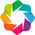

:Layout
   .BoxWhisker.Áramtermelés_eloszlása_zónánként              :BoxWhisker   [ZONEID]   (POWER)
   .BoxWhisker.Áramtermelés_eloszlása_óránként_csoportosítva :BoxWhisker   [HOUR]   (POWER)

In [103]:
import numpy as np
import holoviews as hv
hv.extension('bokeh')
title = "Áramtermelés eloszlása zónánként"
df 
boxwhisker = hv.BoxWhisker(df, ('ZONEID','Zóna'), ('POWER','Teljesítmény'), label=title)
boxwhisker.options(show_legend=False, width=500,height=500)
title2 = "Áramtermelés eloszlása óránként csoportosítva"
boxwhisker2 = hv.BoxWhisker(df, ('HOUR','Óra'), ('POWER','Teljesítmény'), label=title2)
boxwhisker2.options(show_legend=False, width=500,height=500)

options = {'BoxWhisker': dict(width=500, height=500)}

(boxwhisker + boxwhisker2).options(options)

In [104]:
boxwhisker.options({'BoxWhisker': dict(width=350, height=500)})

:BoxWhisker   [ZONEID]   (POWER)

In [105]:
boxwhisker2.options({'BoxWhisker': dict(width=800, height=500)})

:BoxWhisker   [HOUR]   (POWER)

In [128]:
ONE_DAY = 24
ONE_WEEK = 7 * ONE_DAY
ONE_MONTH = 30 * ONE_DAY
ONE_YEAR = 365 * ONE_DAY

In [139]:
df.describe()

,ZONEID,POWER,LIQUID_WATER,ICE_WATER,SURFACE_PRESSURE,RELATIVE_HUMIDITY,TOTAL_CLOUD_COVER,WIND_U,WIND_V,TEMPERATURE,SOLAR_RAD,TERMAL_RAD,TOP_NET_SOLAR_RAD,TOTAL_PRECIPATION,YEAR,MONTH,DAY,HOUR
count,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,56952.000000,5.695100e+04,5.695100e+04,5.695100e+04,56951.000000,56952.000000,56952.000000,56952.000000,56952.000000
mean,2.000000,0.186872,0.041470,0.016408,93807.236996,67.610793,0.436522,0.738276,-0.257701,285.435328,8.811589e+05,1.095588e+06,1.121476e+06,0.000081,2012.843342,6.370523,15.723135,11.500000
std,0.816504,0.274926,0.122040,0.050371,1106.902058,20.336232,0.400015,2.452712,1.983266,7.051843,1.761921e+06,1.509609e+05,2.167440e+06,0.000453,0.716956,3.358555,8.797155,6.922247
min,1.000000,0.000000,0.000000,0.000000,90345.875000,6.348233,0.000000,-8.908603,-8.404230,269.436279,0.000000e+00,7.515360e+05,0.000000e+00,0.000000,2012.000000,1.000000,1.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,92903.000000,52.359467,0.012650,-0.775085,-1.594760,280.142761,0.000000e+00,9.719245e+05,0.000000e+00,0.000000,2012.000000,4.000000,8.000000,5.750000
50%,2.000000,0.003117,0.002919,0.000117,94008.093750,70.545609,0.353457,0.368076,-0.411445,284.784790,3.753100e+04,1.089328e+06,1.215610e+05,0.000000,2013.000000,6.000000,16.000000,11.500000
75%,3.000000,0.333608,0.033479,0.007191,94668.203125,84.952175,0.884594,2.143609,0.944802,290.000977,1.427410e+06,1.208264e+06,1.795776e+06,0.000001,2013.000000,9.000000,23.000000,17.250000
max,3.000000,1.003550,4.103422,0.820470,96317.125000,102.838364,1.000008,13.056718,10.710998,310.458496,2.572125e+07,1.604109e+06,2.750734e+07,0.024791,2014.000000,12.000000,31.000000,23.000000


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
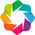

:GridMatrix   [X,Y]
   :NdOverlay   [ZONEID]
      :Scatter   [YEAR]   (YEAR)

In [140]:
import numpy as np
import holoviews as hv
hv.extension('bokeh')
from bokeh.sampledata.iris import flowers
from holoviews.operation import gridmatrix

ds = hv.Dataset(df.head(10))

grouped_by_species = ds.groupby('ZONEID', container_type=hv.NdOverlay)
grid = gridmatrix(grouped_by_species, diagonal_type=hv.Scatter)
grid.options('Scatter', tools=['hover', 'box_select'], bgcolor='#efe8e2', fill_alpha=0.2, size=4)

In [129]:
accumlated_columns = ["SOLAR_RAD","TERMAL_RAD","TOP_NET_SOLAR_RAD","TOTAL_PRECIPATION"]
def dissipate_features(df, columns):
    for column in columns:
        df[column] = df[column].rolling(window=2).apply(lambda x: x[1] if x[1] - x[0] < 0 else x[1] - x[0], raw='True')
    return df
df = dissipate_features(df=df, columns=accumlated_columns)

In [134]:
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error,explained_variance_score
pd.options.mode.chained_assignment = None

def train_predict(X_train, y_train,X_test,y_test,model):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return y_pred

def evaluate_model(df,model,name,columns,windows,step,size):
    for column,window in zip(columns,windows):
        rolling_column = df[column].rolling(window = window)
        df["ROLLING_MEAN_"+column+"_"+str(window)] = rolling_column.mean().shift(step)
        df["ROLLING_MAX_"+column+"_"+str(window)] = rolling_column.max().shift(step)
        df["ROLLING_SUM_"+column+"_"+str(window)] = rolling_column.sum().shift(step)
        df["ROLLING_MEDIAN_"+column+"_"+str(window)] = rolling_column.median().shift(step)
        df["ROLLING_STD_"+column+"_"+str(window)] = rolling_column.std().shift(step)
        df["ROLLING_VAR_"+column+"_"+str(window)] = rolling_column.var().shift(step)
    
    X = df[:size].dropna(axis=0).drop("POWER",axis=1).values
    y = df[:size].dropna(axis=0).POWER
    
    tscv = TimeSeriesSplit(n_splits=int(size/step))
    #print(tscv)  
    y_preds = np.array(1)
    y_tests = np.array(1)
    for train_index, test_index in tscv.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        y_preds = np.append(y_preds,train_predict(X_train,y_train,X_test,y_test,model))
        y_tests = np.append(y_tests,y_test.values)
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(y_tests)
    ax.plot(y_preds)
    ax.set_title(name)
    return explained_variance_score(y_preds,y_tests)

def evaluate_models(df,models,names,columns,windows,step,size):
    model_scores = []
    for name,model in zip(names,models):
        model_scores.append(evaluate_model(df,model,name,columns,windows,step,size))
    return dict(zip(names, model_scores))

def do_all(df,models,names,columns,windows,step,size):
    for i in range(1,4):
        df_to_train = df[df["ZONEID"] == i].drop('ZONEID',axis=1)
        results = evaluate_models(df_to_train,models,names,columns,windows,step,size)
        #fig,ax = plt.subplots(figsize=(20,5))
        #results.boxplot(ax=ax, showfliers=False)
        print("| Zone:{0} | {1} |".format(i,results))

| Zone:1 | {'XGBoost Tree': 0.8999886820419839, 'RandomForestRegressor': 0.8946849105816665, 'AdaBoostRegressor': 0.7178001647974437, 'BaggingRegressor': 0.8951974106129152} |
| Zone:2 | {'XGBoost Tree': 0.9102961563341603, 'RandomForestRegressor': 0.9028133087150941, 'AdaBoostRegressor': 0.8038298906726019, 'BaggingRegressor': 0.9029642801610798} |
| Zone:3 | {'XGBoost Tree': 0.9049469112853329, 'RandomForestRegressor': 0.8985007842433161, 'AdaBoostRegressor': 0.7667498531655067, 'BaggingRegressor': 0.8969268214455961} |


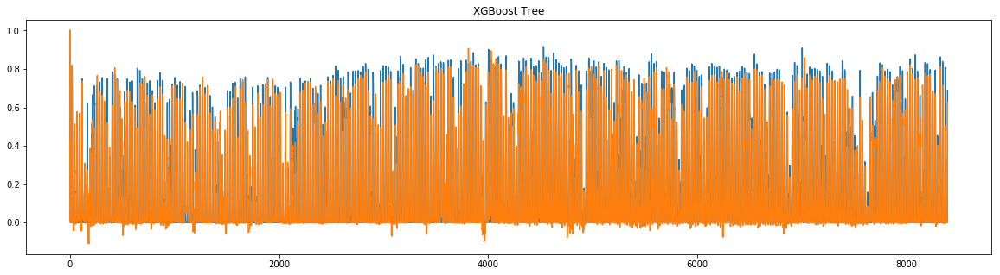

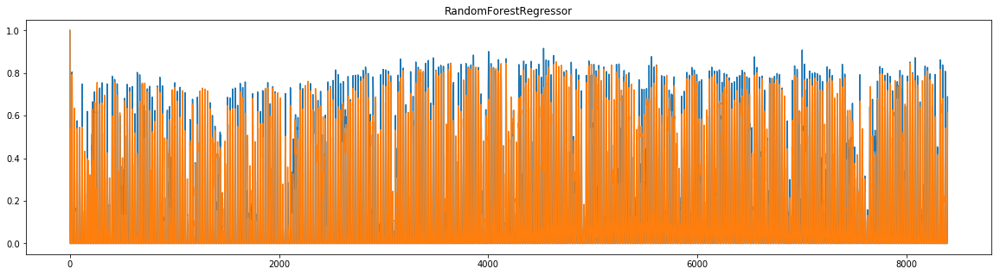

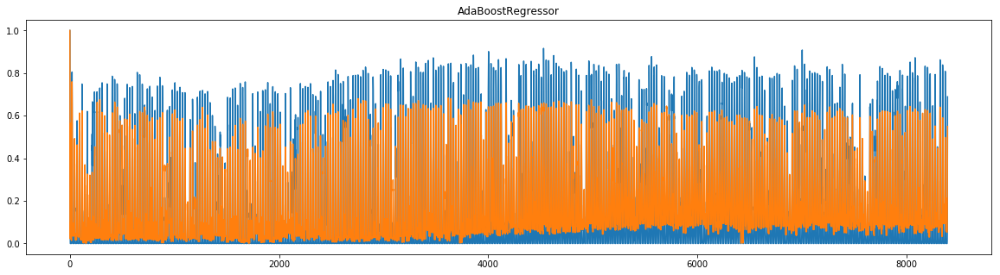

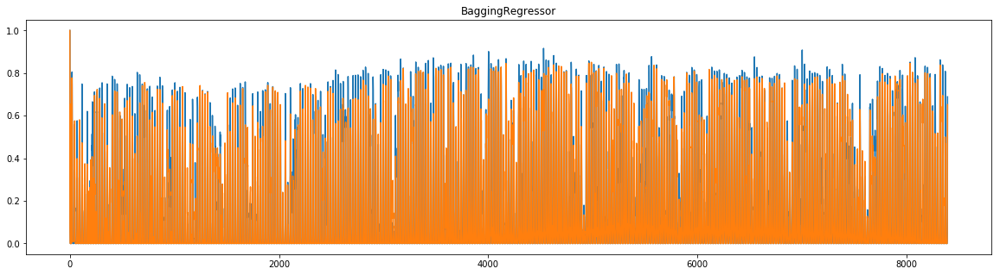

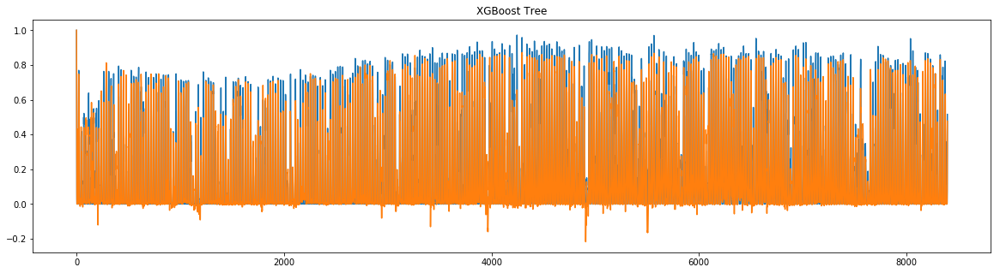

...

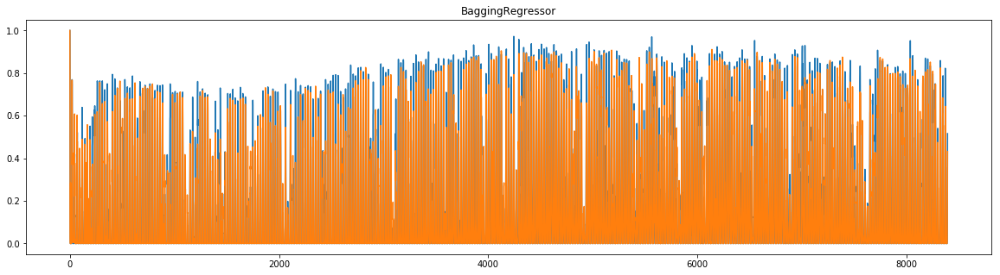

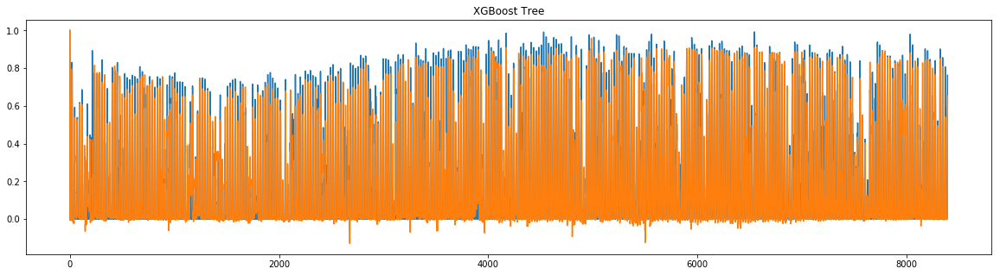

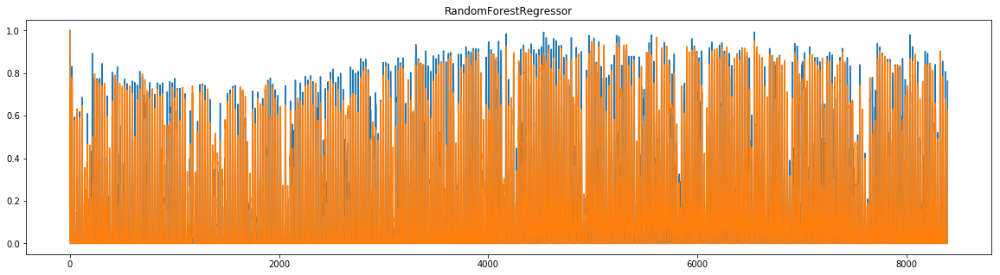

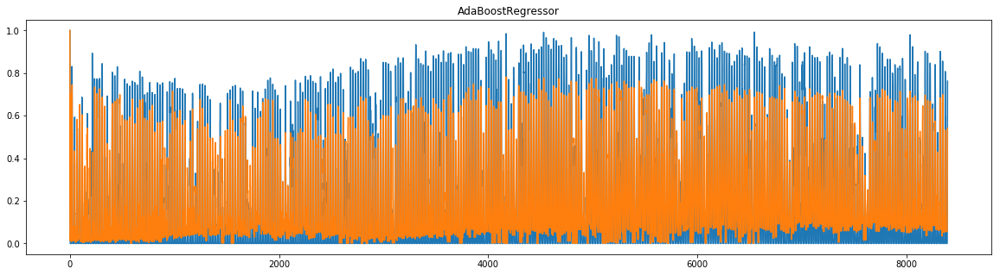

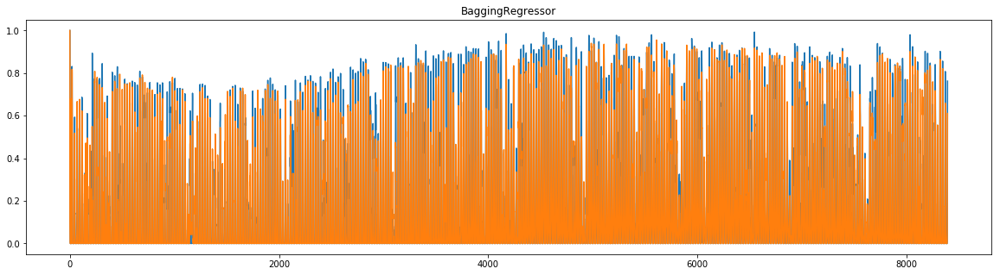

In [137]:
from sklearn.ensemble import AdaBoostRegressor,BaggingRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression,Lasso,ElasticNet,Ridge,SGDRegressor
from xgboost import XGBRegressor
#names=["LinReg", "Lasso","Elastic Net","XGBoost Linear","Ridge","SGDRegressor"]
#models = [LinearRegression(),Lasso(),ElasticNet(),XGBRegressor(booster='gblinear'),Ridge(),SGDRegressor()]
names=["XGBoost Tree","RandomForestRegressor","AdaBoostRegressor", "BaggingRegressor"]
models = [XGBRegressor(nthread=4),RandomForestRegressor(),AdaBoostRegressor(),BaggingRegressor()]
do_all(df,models,names,["POWER"],[ONE_DAY,2*ONE_DAY],ONE_DAY,ONE_YEAR)

0.02501654624938965


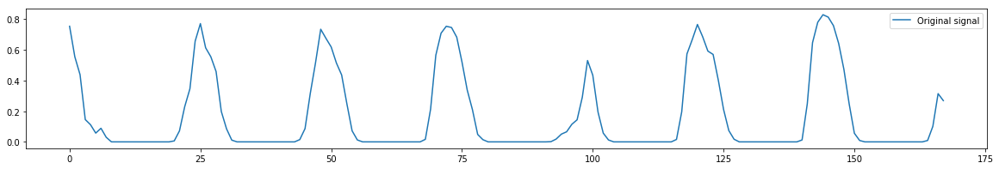

In [231]:
import time
start_time = time.time()
import numpy as np
from scipy import fftpack
from matplotlib import pyplot as plt

# Seed the random number generator
sig = df.POWER[:365*24]

time_step = 1
period = 24
time_vec = np.arange(0, 7*24, 1)

plt.figure(figsize=(20, 3))
plt.plot(time_vec, sig[:7*24], label='Original signal')

# The FFT of the signal
sig_fft = fftpack.fft(sig)

# And the power (sig_fft is of complex dtype)
power = np.abs(sig_fft)

# The corresponding frequencies
sample_freq = fftpack.fftfreq(sig.size, d=time_step)

# # Plot the FFT power
# fig, ax = plt.subplots(1,2,figsize=(20,6))
# ax[0].plot(sample_freq, power)
# ax[0].set_xlabel('Frekvencia [Hz]')
# ax[0].set_ylabel('plower')

# Find the peak frequency: we can focus on only the positive frequencies
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

# Check that it does indeed correspond to the frequency that we generate
# the signal with
np.allclose(peak_freq, 1./period)
# An inner plot to show the peak frequency

# ax[0].set_title('Csúcs frekvencia')
# ax[0].plot(freqs[:8], power[:8])

# scipy.signal.find_peaks_cwt can also be used for more advanced
# peak detection

high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
filtered_sig = fftpack.ifft(high_freq_fft)

# #plt.figure()
# ax[1].plot(time_vec, sig[:7*24], label='Eredeti jel')
# ax[1].plot(time_vec, (filtered_sig+abs(sig-filtered_sig).mean())[:7*24], linewidth=3, label='Szűrt jel')
# ax[1].plot(time_vec, np.sqrt(np.power(sig-filtered_sig,2))[:7*24], linewidth=3, label='Hiba',color='crimson')
# ax[1].set_xlabel('Idő [s]')
# ax[1].set_ylabel('Amplitúdó')

plt.legend(loc='best')
np.sqrt(mean_squared_error(filtered_sig,sig))
sig2 = df.POWER[365*24:365*24*2]
np.sqrt(mean_squared_error(filtered_sig,sig2))
print(time.time()-start_time)

In [253]:
# Importing everything from above

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [257]:

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# for time-series cross-validation set 5 folds 
tscv = TimeSeriesSplit(n_splits=5)

def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

def plotModelResults(model, X_train, X_test, plot_intervals=False, plot_anomalies=False, scale=1.96):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_squared_error")
        #mae = cv.mean() * (-1)
        deviation = np.sqrt(cv.std())
        
        lower = prediction - (scale * deviation)
        upper = prediction + (scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

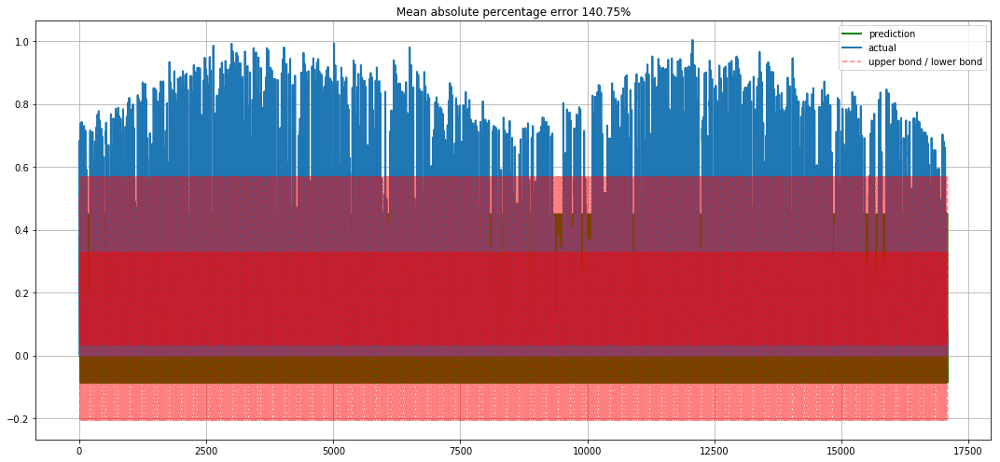

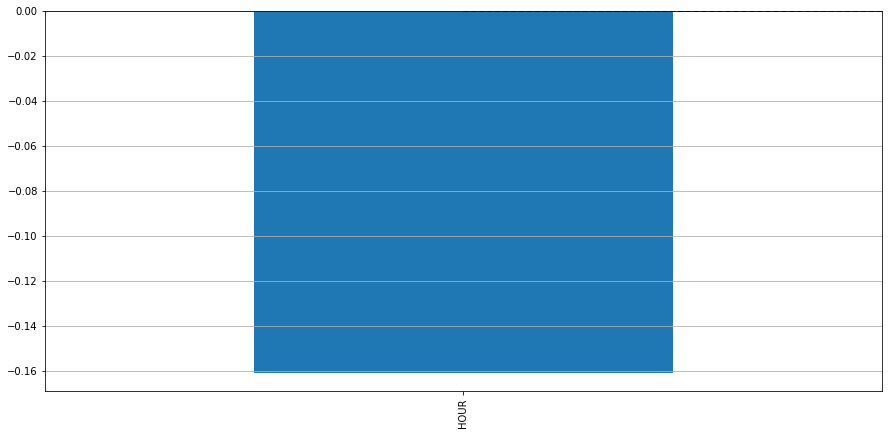

In [258]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

data = df[["POWER","HOUR"]].rename(index=str,columns={"POWER":"y"}).reset_index().drop('TIMESTAMP',axis=1)

y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)